# Fake News Detection with Machine Learning and BERT

**Author:** Aharon Rabson  
**Course:** MSc  
**Date:** 8/1/2025

---

### Project Overview

This notebook explores automated fake news detection using both classical machine learning (Logistic Regression, Random Forest) and advanced deep learning (BERT) techniques. The workflow includes data cleaning, exploratory analysis, feature engineering, model training, performance evaluation, and state-of-the-art explainability with SHAP. All analysis is performed on the open Fake and Real News datasets from Kaggle, with a strong emphasis on reproducibility and transparency.  
**All code and results are fully self-contained for review.**

---



In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
import torch
from transformers import BertTokenizer, BertForSequenceClassification, Trainer, TrainingArguments
from tqdm import tqdm
import shap
import warnings
warnings.filterwarnings("ignore")

In [4]:
# Load datasets (adjust path as needed)
fake = pd.read_csv('/Fake.csv', engine='python', on_bad_lines='skip')
true = pd.read_csv('/True.csv', engine='python', on_bad_lines='skip')


# Add label columns
fake['label'] = 0
true['label'] = 1

# Concatenate and shuffle
df = pd.concat([fake, true]).sample(frac=1, random_state=42).reset_index(drop=True)
df = df[['title', 'text', 'subject', 'date', 'label']]

# Preview
print(df.head())


                                               title  \
0  Ben Stein Calls Out 9th Circuit Court: Committ...   
1  Trump drops Steve Bannon from National Securit...   
2  Puerto Rico expects U.S. to lift Jones Act shi...   
3   OOPS: Trump Just Accidentally Confirmed He Le...   
4  Donald Trump heads for Scotland to reopen a go...   

                                                text       subject  \
0  21st Century Wire says Ben Stein, reputable pr...       US_News   
1  WASHINGTON (Reuters) - U.S. President Donald T...  politicsNews   
2  (Reuters) - Puerto Rico Governor Ricardo Rosse...  politicsNews   
3  On Monday, Donald Trump once again embarrassed...          News   
4  GLASGOW, Scotland (Reuters) - Most U.S. presid...  politicsNews   

                  date  label  
0    February 13, 2017      0  
1       April 5, 2017       1  
2  September 27, 2017       1  
3         May 22, 2017      0  
4       June 24, 2016       1  


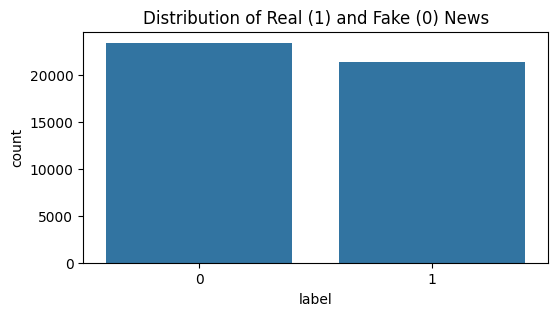

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


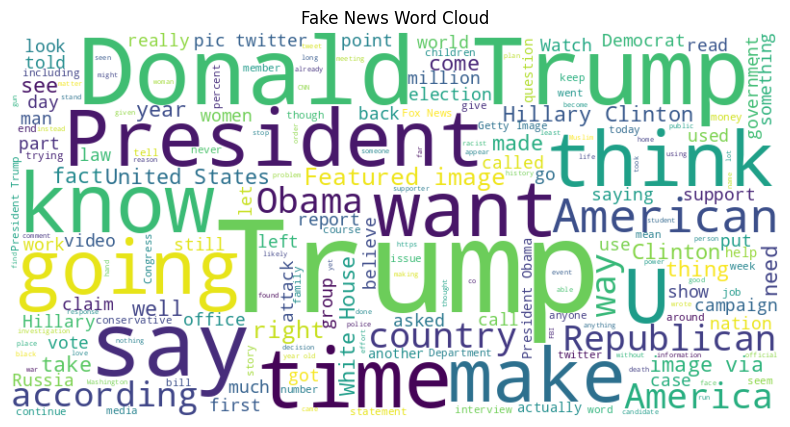

In [8]:
# Distribution of labels
plt.figure(figsize=(6,3))
sns.countplot(x='label', data=df)
plt.title('Distribution of Real (1) and Fake (0) News')
plt.show()

from wordcloud import WordCloud, STOPWORDS
import nltk
from nltk.corpus import stopwords

# Make sure stopwords are downloaded
nltk.download('stopwords')

# Extend stopwords with domain-specific/common words
custom_stopwords = set(stopwords.words('english')).union(STOPWORDS)
custom_stopwords.update(['said', 'one', 'people', 'will', 'new', 'state', 'us', 'also', 'can', 'would', 'mr', 'many', 'two', 'now', 'may', 'even', 'like'])

# Join text for fake news
text = ' '.join(df[df.label == 0]['text'].dropna().values)

# Generate word cloud with custom stopwords
wc = WordCloud(max_words=200, background_color='white', stopwords=custom_stopwords, width=800, height=400).generate(text)
plt.figure(figsize=(10, 5))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title('Fake News Word Cloud')
plt.show()


In [9]:
import re
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
nltk.download('stopwords')
nltk.download('wordnet')

stop_words = set(stopwords.words('english'))
custom_stopwords = stop_words.union({'said', 'one', 'people', 'will', 'new', 'state', 'us', 'also', 'can', 'would', 'mr', 'many', 'two', 'now', 'may', 'even', 'like'})
lemmatizer = WordNetLemmatizer()

def clean_text(text):
    text = str(text).lower()
    text = re.sub(r'[^a-z ]', '', text)
    tokens = [lemmatizer.lemmatize(word) for word in text.split() if word not in custom_stopwords]
    return ' '.join(tokens)

df['clean_text'] = df['title'].astype(str) + ' ' + df['text'].astype(str)
df['clean_text'] = df['clean_text'].apply(clean_text)



[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...


In [10]:
X = df['clean_text']
y = df['label']
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)


Logistic Regression:
               precision    recall  f1-score   support

           0       0.99      0.99      0.99      4696
           1       0.98      0.99      0.99      4284

    accuracy                           0.99      8980
   macro avg       0.99      0.99      0.99      8980
weighted avg       0.99      0.99      0.99      8980

Random Forest:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      4696
           1       1.00      1.00      1.00      4284

    accuracy                           1.00      8980
   macro avg       1.00      1.00      1.00      8980
weighted avg       1.00      1.00      1.00      8980



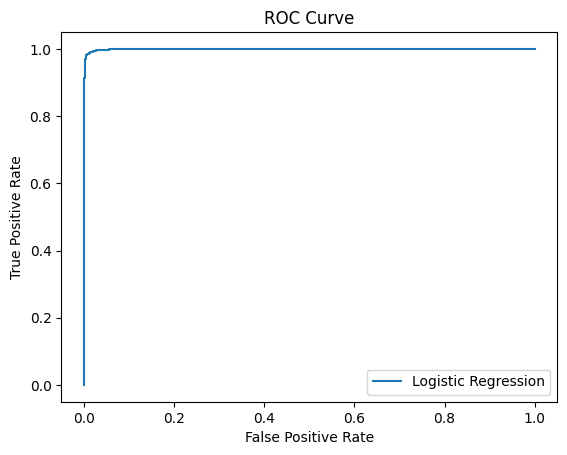

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4696
           1       0.98      0.99      0.99      4284

    accuracy                           0.99      8980
   macro avg       0.99      0.99      0.99      8980
weighted avg       0.99      0.99      0.99      8980

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4696
           1       1.00      1.00      1.00      4284

    accuracy                           1.00      8980
   macro avg       1.00      1.00      1.00      8980
weighted avg       1.00      1.00      1.00      8980



In [11]:
vectorizer = TfidfVectorizer(max_features=10000, ngram_range=(1,2))
X_train_tfidf = vectorizer.fit_transform(X_train)
X_test_tfidf = vectorizer.transform(X_test)

# Logistic Regression
lr = LogisticRegression(max_iter=500)
lr.fit(X_train_tfidf, y_train)
y_pred_lr = lr.predict(X_test_tfidf)
print("Logistic Regression:\n", classification_report(y_test, y_pred_lr))

# Random Forest
rf = RandomForestClassifier(n_estimators=100)
rf.fit(X_train_tfidf, y_train)
y_pred_rf = rf.predict(X_test_tfidf)
print("Random Forest:\n", classification_report(y_test, y_pred_rf))

# ROC Curve
lr_probs = lr.predict_proba(X_test_tfidf)[:,1]
fpr, tpr, _ = roc_curve(y_test, lr_probs)
plt.plot(fpr, tpr, label='Logistic Regression')
plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

print(classification_report(y_test, y_pred_lr))
print(classification_report(y_test, y_pred_rf))


In [13]:
import numpy as np

feature_names = vectorizer.get_feature_names_out()
coefs = lr.coef_[0]
top_n = 20  # number of top words to show

# Top predictors for REAL news (positive coefficients)
top_real_idx = np.argsort(coefs)[-top_n:][::-1]
print("Top words predicting REAL news:")
for idx in top_real_idx:
    print(f"{feature_names[idx]}: {coefs[idx]:.3f}")

# Top predictors for FAKE news (negative coefficients)
top_fake_idx = np.argsort(coefs)[:top_n]
print("\nTop words predicting FAKE news:")
for idx in top_fake_idx:
    print(f"{feature_names[idx]}: {coefs[idx]:.3f}")

Top words predicting REAL news:
reuters: 23.589
washington reuters: 10.014
wednesday: 6.176
president donald: 5.816
tuesday: 5.770
washington: 5.440
thursday: 5.297
friday: 4.993
reuters president: 4.794
monday: 4.781
statement: 4.366
dont: 4.030
spokesman: 3.953
nov: 3.839
minister: 3.719
im: 3.651
comment: 3.553
edt: 3.417
presidential: 3.406
thats: 3.363

Top words predicting FAKE news:
video: -10.269
image: -8.813
via: -8.799
gop: -6.093
president trump: -6.091
hillary: -6.040
image via: -5.160
obama: -4.930
america: -4.494
american: -4.481
wire: -4.294
watch: -3.896
breaking: -3.868
president obama: -3.785
rep: -3.501
isi: -3.448
fact: -3.342
know: -3.221
daily: -3.220
sen: -3.165


In [14]:
from transformers import BertTokenizer, BertForSequenceClassification, Trainer, TrainingArguments
import torch

# Use a small subset for demonstration (BERT is slow on CPU)
sample_df = df.sample(n=4000, random_state=42).reset_index(drop=True)
train_texts, test_texts, train_labels, test_labels = train_test_split(
    sample_df['clean_text'].tolist(), sample_df['label'].tolist(),
    test_size=0.2, stratify=sample_df['label'], random_state=42
)

tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

train_encodings = tokenizer(train_texts, truncation=True, padding=True, max_length=128)
test_encodings = tokenizer(test_texts, truncation=True, padding=True, max_length=128)

class NewsDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels
    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item
    def __len__(self):
        return len(self.labels)

train_dataset = NewsDataset(train_encodings, train_labels)
test_dataset = NewsDataset(test_encodings, test_labels)

model = BertForSequenceClassification.from_pretrained('bert-base-uncased')

training_args = TrainingArguments(
    output_dir='./results', num_train_epochs=2, per_device_train_batch_size=8,
    per_device_eval_batch_size=8, eval_strategy="epoch", save_steps=500, logging_steps=100
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
)

trainer.train()
trainer.evaluate()

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
wandb: WARNING The `run_name` is currently set to the same value as `TrainingArguments.output_dir`. If this was not intended, please specify a different run name by setting the `TrainingArguments.run_name` parameter.


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize?ref=models
wandb: Paste an API key from your profile and hit enter:

 ··········


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: aharonrabson (aharonrabson-bellevue-university) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


Epoch,Training Loss,Validation Loss
1,0.018200,0.046048
2,0.044800,0.027616


{'eval_loss': 0.027616212144494057,
 'eval_runtime': 349.4538,
 'eval_samples_per_second': 2.289,
 'eval_steps_per_second': 0.286,
 'epoch': 2.0}

In [17]:
import shap
import torch

# We'll use a few test samples for explainability (e.g., 5 samples for speed)
num_explain = 5
example_texts = test_texts[:num_explain]

# TRUNCATE EXAMPLES TO 512 WORDS (Insert this fix here!)
def truncate_text(text, max_words=512):
    return ' '.join(text.split()[:max_words])

truncated_examples = [truncate_text(t, 250) for t in example_texts]

# The pipeline API wraps tokenization and prediction (recommended for SHAP)
from transformers import pipeline

bert_pipe = pipeline('text-classification', model=model, tokenizer=tokenizer, device=0 if torch.cuda.is_available() else -1)

# SHAP's TextExplainer works well with the pipeline API
explainer = shap.Explainer(bert_pipe)

# Compute SHAP values for truncated example texts
shap_values = explainer(truncated_examples)

# Plot explanations
shap.plots.text(shap_values)


Device set to use cpu


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  20%|██        | 1/5 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  60%|██████    | 3/5 [12:24<07:23, 221.79s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  80%|████████  | 4/5 [23:18<06:41, 401.82s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 100%|██████████| 5/5 [32:03<00:00, 447.78s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 6it [35:35, 427.20s/it]


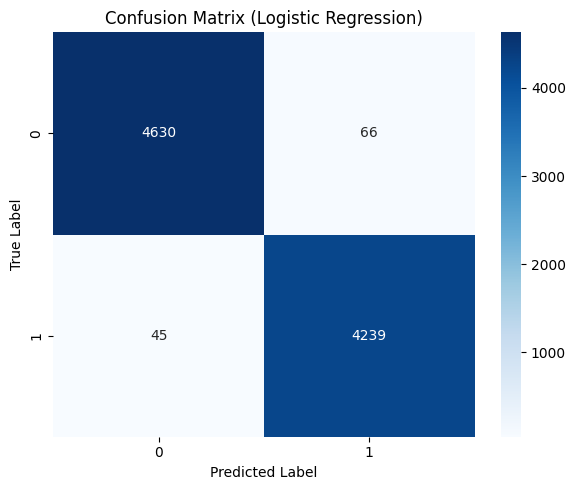

In [18]:
# Save confusion matrix as image
import seaborn as sns
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred_lr)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix (Logistic Regression)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.tight_layout()
plt.savefig('confusion_matrix_lr.png', dpi=150)
plt.show()



In [19]:
# Data dictionary
data_dict = {
    'title': 'Headline of the news article',
    'text': 'Full article content',
    'subject': 'News category (e.g., politics, world news)',
    'date': 'Date of publication',
    'label': '0 = Fake, 1 = True',
    'clean_text': 'Preprocessed combined title and text'
}
print(pd.DataFrame(list(data_dict.items()), columns=['Column', 'Description']))


       Column                                 Description
0       title                Headline of the news article
1        text                        Full article content
2     subject  News category (e.g., politics, world news)
3        date                         Date of publication
4       label                          0 = Fake, 1 = True
5  clean_text        Preprocessed combined title and text
